In [1543]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import warnings

In [1544]:
df=pd.read_csv("municipality_bus_utilization.csv")
df.head()

,timestamp,municipality_id,usage,total_capacity
0,2017-06-04 07:59:42,9,454,1332
1,2017-06-04 07:59:42,8,556,2947
2,2017-06-04 07:59:42,4,1090,3893
3,2017-06-04 07:59:42,0,204,2813
4,2017-06-04 07:59:42,7,718,2019


# DATA MANİPÜLASYONU

In [1545]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
municipality_id,13070.0,4.500000,2.872391,0.0,2.0,4.5,7.0,9.0
usage,13070.0,876.002984,679.287109,11.0,403.0,692.0,1190.0,3508.0
total_capacity,13070.0,1972.800000,1144.074782,397.0,697.0,1974.5,2947.0,3893.0


In [1546]:
# HER BELEDİYEDEN ALINAN ÖLÇÜM SAYISI
df["municipality_id"].value_counts()

9    1307
8    1307
4    1307
0    1307
7    1307
5    1307
2    1307
1    1307
6    1307
3    1307
Name: municipality_id, dtype: int64

In [1547]:
# HER BELEDİYENİN OTOBÜS KAPASİTESİ
totalBus=df.groupby("municipality_id")["total_capacity"].mean().sort_values()
totalBus

municipality_id
1     397.0
5     587.0
2     697.0
9    1332.0
3    1930.0
7    2019.0
0    2813.0
8    2947.0
6    3113.0
4    3893.0
Name: total_capacity, dtype: float64

In [1548]:
# HER BELEDİYENİN OTOBÜS KULLANIMI
busUsage=df.groupby("municipality_id")["usage"].sum()
busUsage

municipality_id
0     719586
1     389579
2     636502
3    1409291
4    3014607
5     224124
6    1340748
7    1502120
8    1335421
9     877381
Name: usage, dtype: int64

In [1549]:
#Sırasıyla 5-1-2-0 Kapasitesini Küçültmeli Çünkü Kapasitesini Dolduramıyor
print(f"0 NOLU Belediye Kapasitesinin %{busUsage[0]/(totalBus[0]*1307)*100}'sını kullanmış")
print(f"1 NOLU Belediye Kapasitesinin %{busUsage[1]/(totalBus[0]*1307)*100}'sını kullanmış")
print(f"2 NOLU Belediye Kapasitesinin %{busUsage[2]/(totalBus[0]*1307)*100}'sını kullanmış")
print(f"3 NOLU Belediye Kapasitesinin %{busUsage[3]/(totalBus[0]*1307)*100}'sını kullanmış")
print(f"4 NOLU Belediye Kapasitesinin %{busUsage[4]/(totalBus[0]*1307)*100}'sını kullanmış")
print(f"5 NOLU Belediye Kapasitesinin %{busUsage[5]/(totalBus[0]*1307)*100}'sını kullanmış")
print(f"6 NOLU Belediye Kapasitesinin %{busUsage[6]/(totalBus[0]*1307)*100}'sını kullanmış")
print(f"7 NOLU Belediye Kapasitesinin %{busUsage[7]/(totalBus[0]*1307)*100}'sını kullanmış")
print(f"8 NOLU Belediye Kapasitesinin %{busUsage[8]/(totalBus[0]*1307)*100}'sını kullanmış")
print(f"9 NOLU Belediye Kapasitesinin %{busUsage[9]/(totalBus[0]*1307)*100}'sını kullanmış")

0 NOLU Belediye Kapasitesinin %19.572098174640583'sını kullanmış
1 NOLU Belediye Kapasitesinin %10.59620175320018'sını kullanmış
2 NOLU Belediye Kapasitesinin %17.31228738796347'sını kullanmış
3 NOLU Belediye Kapasitesinin %38.33145976802968'sını kullanmış
4 NOLU Belediye Kapasitesinin %81.99462491204488'sını kullanmış
5 NOLU Belediye Kapasitesinin %6.095973144687565'sını kullanmış
6 NOLU Belediye Kapasitesinin %36.467151227862985'sını kullanmış
7 NOLU Belediye Kapasitesinin %40.856325873614985'sını kullanmış
8 NOLU Belediye Kapasitesinin %36.32226157328895'sını kullanmış
9 NOLU Belediye Kapasitesinin %23.86398160687441'sını kullanmış


# DÖNÜŞÜMLER

In [1550]:
# timestamp Üzerinde İşlem Yapabilmek İçin Tipini Değiştirdik
df['timestamp'] = pd.to_datetime(df['timestamp'])

In [1551]:
df.head()

,timestamp,municipality_id,usage,total_capacity
0,2017-06-04 07:59:42,9,454,1332
1,2017-06-04 07:59:42,8,556,2947
2,2017-06-04 07:59:42,4,1090,3893
3,2017-06-04 07:59:42,0,204,2813
4,2017-06-04 07:59:42,7,718,2019


In [1552]:
traindata = df.iloc[:10390,:]
testdata = df.iloc[10390:,:]

In [1553]:
traindata = traindata.sort_values(["municipality_id","timestamp"], ascending = (True,True))
testdata = testdata.sort_values(["municipality_id","timestamp"], ascending = (True,True))

In [1554]:
traindata

,timestamp,municipality_id,usage,total_capacity
3,2017-06-04 07:59:42,0,204,2813
18,2017-06-04 08:25:42,0,247,2813
29,2017-06-04 08:59:42,0,332,2813
34,2017-06-04 09:32:46,0,429,2813
47,2017-06-04 09:59:48,0,485,2813
...,...,...,...,...
10346,2017-08-02 14:25:50,9,803,1332
10359,2017-08-02 14:58:50,9,763,1332
10364,2017-08-02 15:31:52,9,730,1332
10373,2017-08-02 15:58:52,9,671,1332


In [1555]:
testdata

,timestamp,municipality_id,usage,total_capacity
10398,2017-08-05 08:02:03,0,209,2813
10407,2017-08-05 08:29:08,0,252,2813
10416,2017-08-05 09:02:08,0,322,2813
10425,2017-08-05 09:29:08,0,393,2813
10434,2017-08-05 10:03:04,0,460,2813
...,...,...,...,...
13021,2017-08-19 14:30:33,9,983,1332
13035,2017-08-19 15:03:34,9,976,1332
13040,2017-08-19 15:29:33,9,954,1332
13054,2017-08-19 16:03:35,9,879,1332


In [1556]:
# SIRALAMA YAPARAK HER BELEDİYENİN BİLGİSİNİ AYRI BİR DEĞİŞKENDE TUTTUM
#HER BELEDİYENİN 1039 BİLGİSİ VAR ÜSTÜNE EKLEYEREK DİĞER BELEDİYELERİN BİLGİLERİNE ULAŞTIM
traindata[traindata.municipality_id==0].index

Int64Index([    3,    18,    29,    34,    47,    55,    65,    71,    88,
               95,
            ...
            10291, 10303, 10310, 10327, 10337, 10342, 10355, 10361, 10370,
            10385],
           dtype='int64', length=1039)

In [1557]:
# HER BELEDİYEYİ AYRI ŞEKİLDE TRAİN/TEST VERİLERİNİ OLUŞTURACAĞIZ
traindata0 = traindata.iloc[:1039,:]
traindata1 = traindata.iloc[1039:2078,:]
traindata2 = traindata.iloc[2078:3117,:]
traindata3 = traindata.iloc[3117:4156,:]
traindata4 = traindata.iloc[4156:5195,:]
traindata5 = traindata.iloc[5195:6234,:]
traindata6 = traindata.iloc[6234:7273,:]
traindata7 = traindata.iloc[7273:8312,:]
traindata8 = traindata.iloc[8312:9351,:]
traindata9 = traindata.iloc[9351:,:]

In [1558]:
# AYNI ŞEKİL NEREYE KADAR ALACAĞIMI BULUYORUM
testdata[testdata.municipality_id==0].index

Int64Index([10398, 10407, 10416, 10425, 10434, 10440, 10456, 10469, 10477,
            10480,
            ...
            12979, 12988, 12997, 13005, 13013, 13024, 13031, 13041, 13059,
            13062],
           dtype='int64', length=268)

In [1559]:
testdata0 = testdata.iloc[:268,:]
testdata1 = testdata.iloc[268:536,:]
testdata2 = testdata.iloc[536:804,:]
testdata3 = testdata.iloc[804:1072,:]
testdata4 = testdata.iloc[1072:1340,:]
testdata5 = testdata.iloc[1340:1608,:]
testdata6 = testdata.iloc[1608:1876,:]
testdata7 = testdata.iloc[1876:2144,:]
testdata8 = testdata.iloc[2144:2412,:]
testdata9 = testdata.iloc[2412:,:]

In [1560]:
# HER SAATTE MAKSİMUM OLAN DEĞERİ ALDIM
finaldata = traindata.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
finaldata

,municipality_id,usage
0,0,204
1,1,129
2,2,273
3,3,623
4,4,1090
...,...,...
5315,5,114
5316,6,1018
5317,7,1169
5318,8,1035


In [1561]:
# HER SAATTE 0. BELEDİYE İÇİN MAKSİMUM  OLAN DEĞERİ ALDIM
finaldata0 = traindata0.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
finaldata0

,municipality_id,usage
0,0,204
1,0,332
2,0,485
3,0,583
4,0,614
...,...,...
527,0,661
528,0,667
529,0,656
530,0,635


In [1562]:
# SAAT BAŞI 0.BELEDİYENİN TAŞIDIĞI MAKSİMUM YOLCU SAYISI
h_data0 = traindata0.groupby([pd.Grouper(key='timestamp', freq='H')])['usage'].max()
h_data0

timestamp
2017-06-04 07:00:00    204.0
2017-06-04 08:00:00    332.0
2017-06-04 09:00:00    485.0
2017-06-04 10:00:00    583.0
2017-06-04 11:00:00    614.0
                       ...  
2017-08-02 12:00:00    661.0
2017-08-02 13:00:00    667.0
2017-08-02 14:00:00    656.0
2017-08-02 15:00:00    635.0
2017-08-02 16:00:00    638.0
Freq: H, Name: usage, Length: 1426, dtype: float64

In [1563]:
finaldata1 = traindata1.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
finaldata2 = traindata2.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
finaldata3 = traindata3.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
finaldata4 = traindata4.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
finaldata5 = traindata5.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
finaldata6 = traindata6.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
finaldata7 = traindata7.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
finaldata8 = traindata8.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
finaldata9 = traindata9.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()

In [1564]:
# AYNI İŞLEMİ TEST İÇİNDE UYGULADIK (try-test aynı anlamı içerdiği için onunla isimlendirdim)
trydata0 = testdata0.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
trydata1 = testdata1.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
trydata2 = testdata2.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
trydata3 = testdata3.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
trydata4 = testdata4.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
trydata5 = testdata5.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
trydata6 = testdata6.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
trydata7 = testdata7.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
trydata8 = testdata8.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()
trydata9 = testdata9.groupby([pd.Grouper(key='timestamp', freq='H'), 'municipality_id'], as_index=False)['usage'].max()


In [1565]:
trydata0

,municipality_id,usage
0,0,252
1,0,393
2,0,517
3,0,653
4,0,655
...,...,...
137,0,1281
138,0,1283
139,0,1285
140,0,1286


In [1566]:
finaldata0

,municipality_id,usage
0,0,204
1,0,332
2,0,485
3,0,583
4,0,614
...,...,...
527,0,661
528,0,667
529,0,656
530,0,635


TAHMİN VERİLERİ :
532    204.000000
533    204.000000
534    331.360000
535    484.231800
536    582.506159
          ...    
669    696.949041
670    691.029745
671    679.060149
672    630.245301
673    548.411227
Length: 142, dtype: float64
TEST VERİLERİ :
     municipality_id  usage
532                0    252
533                0    393
534                0    517
535                0    653
536                0    655
..               ...    ...
669                0   1281
670                0   1283
671                0   1285
672                0   1286
673                0   1276

[142 rows x 2 columns]


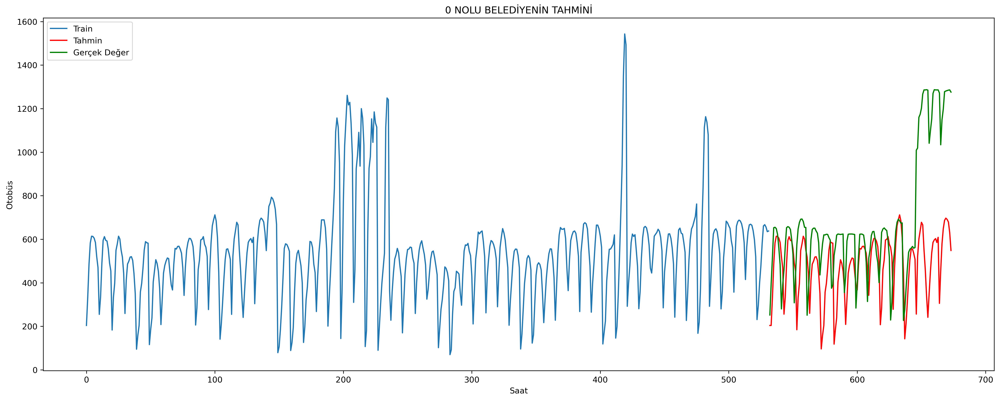

In [1567]:
# 0 Nolu Belediyenin Tahmini
warnings.filterwarnings("ignore")

model0 = ExponentialSmoothing(finaldata0["usage"], trend=None, seasonal=None, seasonal_periods=None)
fit_model0 = model0.fit(optimized=True, use_boxcox=False, remove_bias=False)
pred0 = fit_model0.predict(start=trydata0["usage"].index[0], end=trydata0["usage"].index[-1])

# TEST VERİLERİ GRAFİKTE GÖSTERİLMEK İÇİN EKLEME YAPILDI
# finaldata uzunluğu kadar indekse ekleME yaptık ki karşılaştırmayı görebilelim
pred0.index += len(finaldata0)
print(f"TAHMİN VERİLERİ :\n{pred0}")
trydata0.index += len(finaldata0)
print(f"TEST VERİLERİ :\n{trydata0}")
plt.figure(figsize=(21, 8), dpi=300)
plt.plot(finaldata0["usage"].index, finaldata0["usage"], label='Train')
plt.plot(pred0.index, pred0, 'r-', label = 'Tahmin') 
plt.plot(trydata0["usage"].index, trydata0["usage"], 'g-', label = 'Gerçek Değer')
plt.xlabel('Saat') 
plt.ylabel('Otobüs') 
plt.title('0 NOLU BELEDİYENİN TAHMİNİ')
plt.legend(loc="upper left")

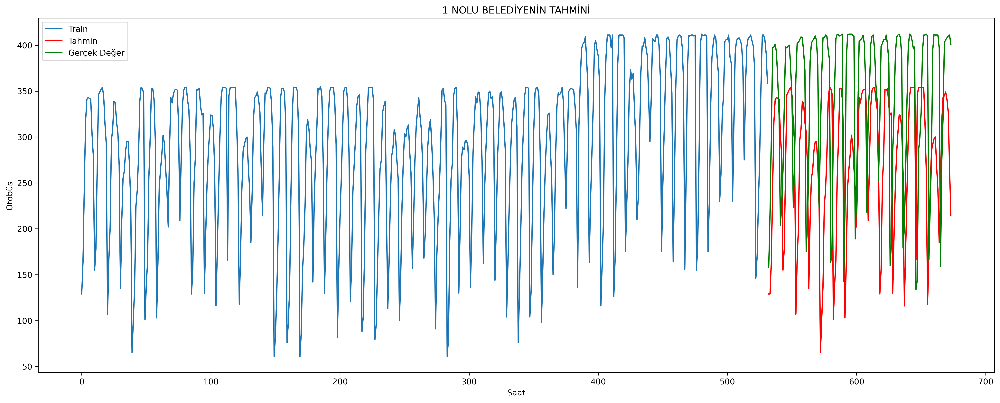

In [1568]:
model1 = ExponentialSmoothing(finaldata1["usage"], trend=None, seasonal=None, seasonal_periods=None)
fit_model1 = model1.fit(optimized=True, use_boxcox=False, remove_bias=False)
pred1 = fit_model1.predict(start=trydata1["usage"].index[0], end=trydata1["usage"].index[-1])

pred1.index += len(finaldata1)

trydata1.index += len(finaldata1)


plt.figure(figsize=(21, 8), dpi=300)
plt.plot(finaldata1["usage"].index, finaldata1["usage"], label='Train')
plt.plot(pred1.index, pred1, 'r-', label = 'Tahmin')
plt.plot(trydata1["usage"].index, trydata1["usage"], 'g-', label = 'Gerçek Değer')
plt.xlabel('Saat') 
plt.ylabel('Otobüs') 
plt.title('1 NOLU BELEDİYENİN TAHMİNİ')
plt.legend(loc="upper left")

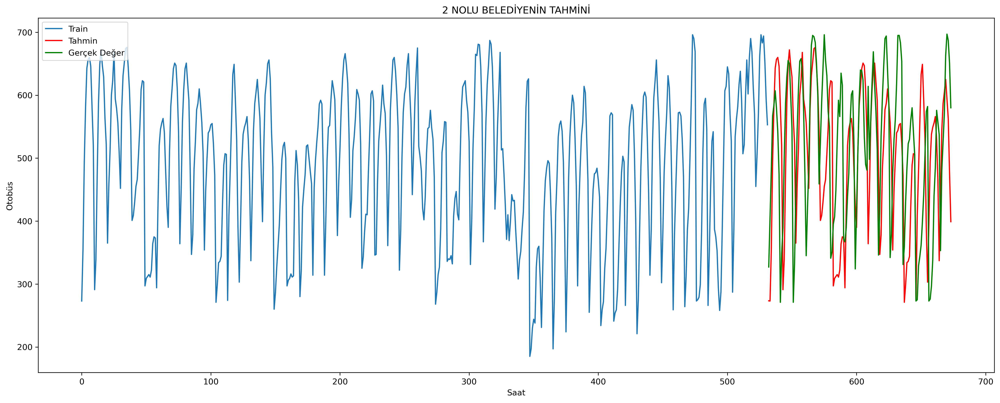

In [1569]:
# Predict2
model2 = ExponentialSmoothing(finaldata2["usage"], trend=None, seasonal=None, seasonal_periods=None)
fit_model2 = model2.fit(optimized=True, use_boxcox=False, remove_bias=False)
pred2 = fit_model2.predict(start=trydata2["usage"].index[0], end=trydata2["usage"].index[-1])

pred2.index += len(finaldata2)
trydata2.index += len(finaldata2)


plt.figure(figsize=(21, 8), dpi=300)
plt.plot(finaldata2["usage"].index, finaldata2["usage"], label='Train')
plt.plot(pred2.index, pred2, 'r-', label = 'Tahmin')
plt.plot(trydata2["usage"].index, trydata2["usage"], 'g-', label = 'Gerçek Değer')
plt.xlabel('Saat') 
plt.ylabel('Otobüs') 
plt.title('2 NOLU BELEDİYENİN TAHMİNİ')
plt.legend(loc="upper left")

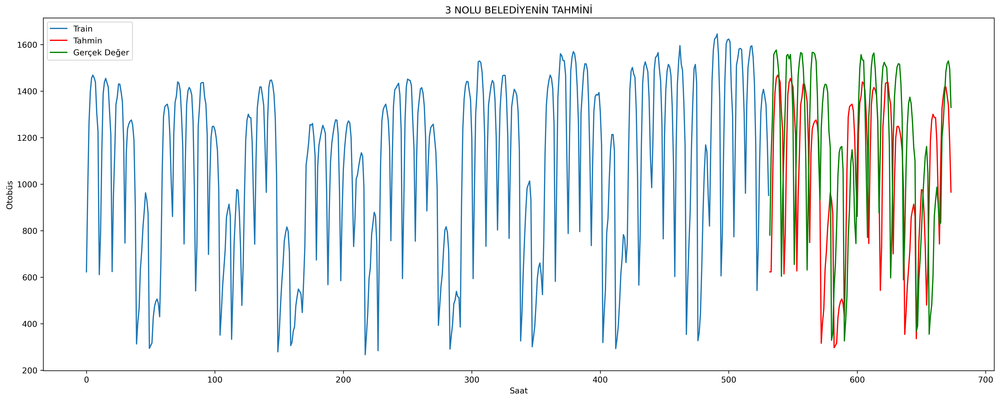

In [1570]:
# Predict3
model3 = ExponentialSmoothing(finaldata3["usage"], trend=None, seasonal=None, seasonal_periods=None)
fit_model3 = model3.fit(optimized=True, use_boxcox=False, remove_bias=False)
pred3 = fit_model3.predict(start=trydata3["usage"].index[0], end=trydata3["usage"].index[-1])

pred3.index += len(finaldata3)
trydata3.index += len(finaldata3)


plt.figure(figsize=(21, 8), dpi=300)
plt.plot(finaldata3["usage"].index, finaldata3["usage"], label='Train')
plt.plot(pred3.index, pred3, 'r-', label = 'Tahmin')
plt.plot(trydata3["usage"].index, trydata3["usage"], 'g-', label = 'Gerçek Değer')
plt.xlabel('Saat') 
plt.ylabel('Otobüs') 
plt.title('3 NOLU BELEDİYENİN TAHMİNİ')
plt.legend(loc="upper left")

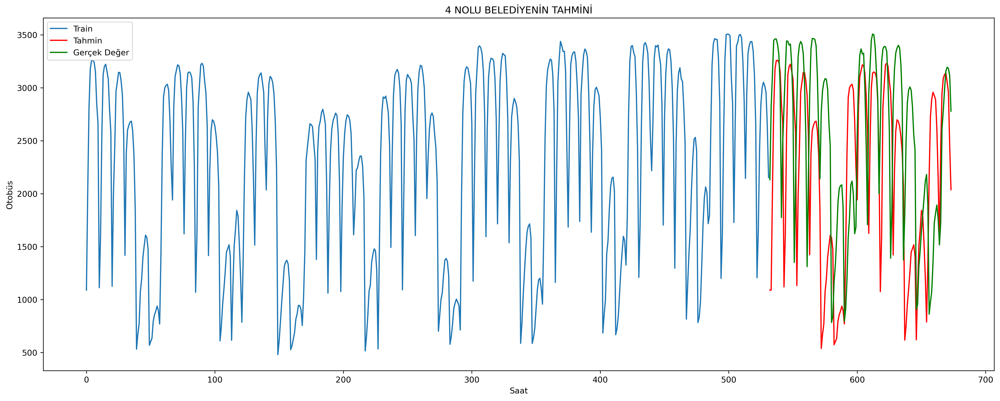

In [1571]:
# Predict4
model4 = ExponentialSmoothing(finaldata4["usage"], trend=None, seasonal=None, seasonal_periods=None)
fit_model4 = model4.fit(optimized=True, use_boxcox=False, remove_bias=False)
pred4 = fit_model4.predict(start=trydata4["usage"].index[0], end=trydata4["usage"].index[-1])

pred4.index += len(finaldata4)
trydata4.index += len(finaldata4)


plt.figure(figsize=(21, 8), dpi=300)
plt.plot(finaldata4["usage"].index, finaldata4["usage"], label='Train')
plt.plot(pred4.index, pred4, 'r-', label = 'Tahmin')
plt.plot(trydata4["usage"].index, trydata4["usage"], 'g-', label = 'Gerçek Değer')
plt.xlabel('Saat') 
plt.ylabel('Otobüs') 
plt.title('4 NOLU BELEDİYENİN TAHMİNİ')
plt.legend(loc="upper left")

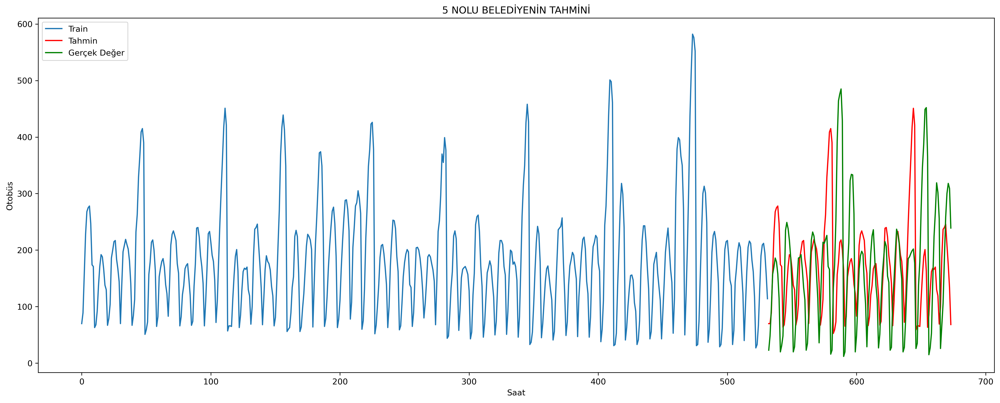

In [1572]:
# Predict5
model5 = ExponentialSmoothing(finaldata5["usage"], trend=None, seasonal=None, seasonal_periods=None)
fit_model5 = model5.fit(optimized=True, use_boxcox=False, remove_bias=False)
pred5 = fit_model5.predict(start=trydata5["usage"].index[0], end=trydata5["usage"].index[-1])

pred5.index += len(finaldata5)

trydata5.index += len(finaldata5)


plt.figure(figsize=(21, 8), dpi=300)
plt.plot(finaldata5["usage"].index, finaldata5["usage"], label='Train')
plt.plot(pred5.index, pred5, 'r-', label = 'Tahmin')
plt.plot(trydata5["usage"].index, trydata5["usage"], 'g-', label = 'Gerçek Değer')
plt.xlabel('Saat') 
plt.ylabel('Otobüs') 
plt.title('5 NOLU BELEDİYENİN TAHMİNİ')
plt.legend(loc="upper left")

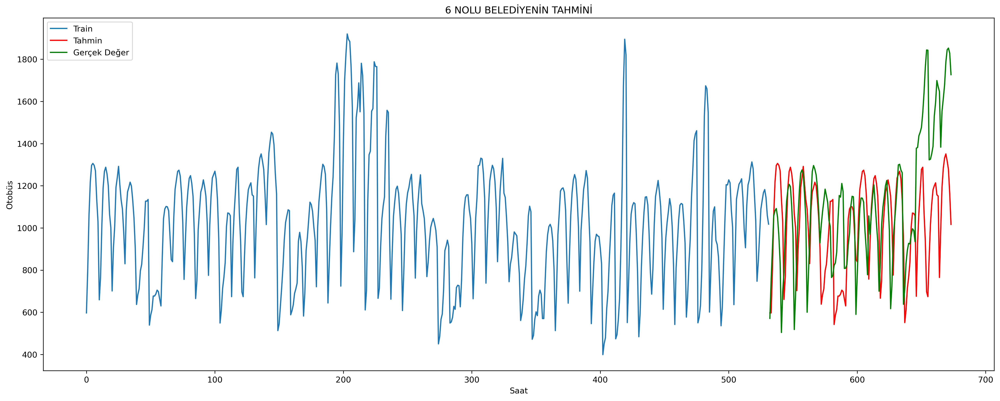

In [1573]:
# Predict6
model6 = ExponentialSmoothing(finaldata6["usage"], trend=None, seasonal=None, seasonal_periods=None)
fit_model6 = model6.fit(optimized=True, use_boxcox=False, remove_bias=False)
pred6 = fit_model6.predict(start=trydata6["usage"].index[0], end=trydata6["usage"].index[-1])

pred6.index += len(finaldata6)
trydata6.index += len(finaldata6)


plt.figure(figsize=(21, 8), dpi=300)
plt.plot(finaldata6["usage"].index, finaldata6["usage"], label='Train')
plt.plot(pred6.index, pred6, 'r-', label = 'Tahmin')
plt.plot(trydata6["usage"].index, trydata6["usage"], 'g-', label = 'Gerçek Değer')
plt.xlabel('Saat') 
plt.ylabel('Otobüs') 
plt.title('6 NOLU BELEDİYENİN TAHMİNİ')
plt.legend(loc="upper left")


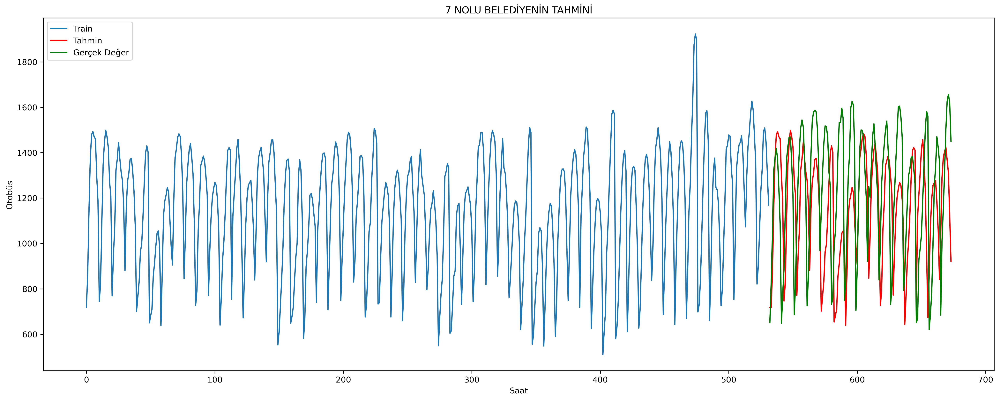

In [1574]:

# Predict7
model7 = ExponentialSmoothing(finaldata7["usage"], trend=None, seasonal=None, seasonal_periods=None)
fit_model7 = model7.fit(optimized=True, use_boxcox=False, remove_bias=False)
pred7 = fit_model7.predict(start=trydata7["usage"].index[0], end=trydata7["usage"].index[-1])

pred7.index += len(finaldata7)
trydata7.index += len(finaldata7)


plt.figure(figsize=(21, 8), dpi=300)
plt.plot(finaldata7["usage"].index, finaldata7["usage"], label='Train')
plt.plot(pred7.index, pred7, 'r-', label = 'Tahmin')
plt.plot(trydata7["usage"].index, trydata7["usage"], 'g-', label = 'Gerçek Değer')
plt.xlabel('Saat') 
plt.ylabel('Otobüs') 
plt.title('7 NOLU BELEDİYENİN TAHMİNİ')
plt.legend(loc="upper left")



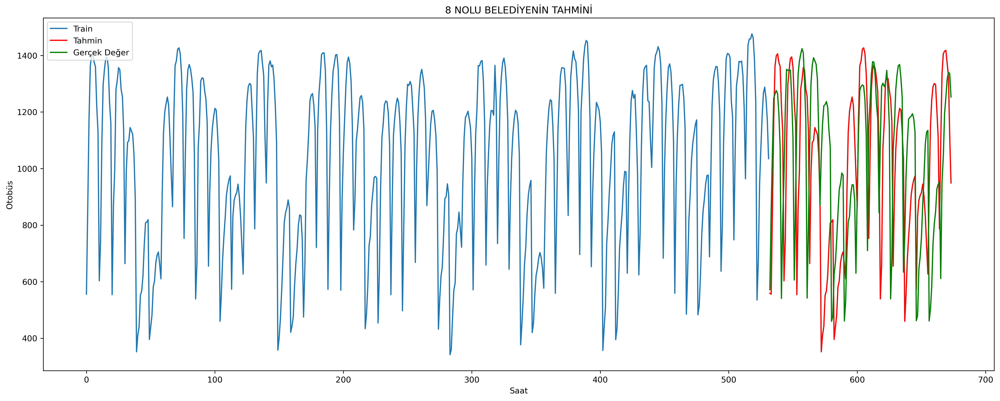

In [1575]:
# Predict8
model8 = ExponentialSmoothing(finaldata8["usage"], trend=None, seasonal=None, seasonal_periods=None)
fit_model8 = model8.fit(optimized=True, use_boxcox=False, remove_bias=False)
pred8 = fit_model8.predict(start=trydata8["usage"].index[0], end=trydata8["usage"].index[-1])

pred8.index += len(finaldata8)
trydata8.index += len(finaldata8)


plt.figure(figsize=(21, 8), dpi=300)
plt.plot(finaldata8["usage"].index, finaldata8["usage"], label='Train')
plt.plot(pred8.index, pred8, 'r-', label = 'Tahmin')
plt.plot(trydata8["usage"].index, trydata8["usage"], 'g-', label = 'Gerçek Değer')
plt.xlabel('Saat') 
plt.ylabel('Otobüs') 
plt.title('8 NOLU BELEDİYENİN TAHMİNİ')
plt.legend(loc="upper left")

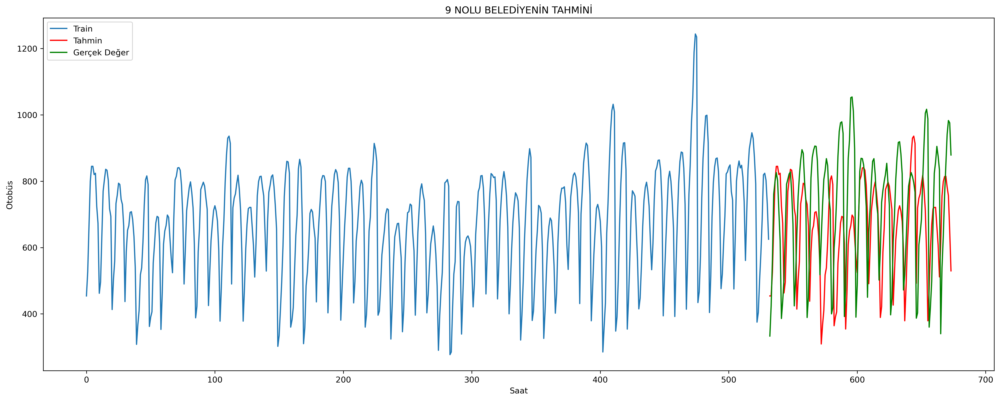

In [1576]:

# Predict9
model9 = ExponentialSmoothing(finaldata9["usage"], trend=None, seasonal=None, seasonal_periods=None)
fit_model9 = model9.fit(optimized=True, use_boxcox=False, remove_bias=False)
pred9 = fit_model9.predict(start=trydata9["usage"].index[0], end=trydata9["usage"].index[-1])

pred9.index += len(finaldata9)
trydata9.index += len(finaldata9)



plt.figure(figsize=(21, 8), dpi=300)
plt.plot(finaldata9["usage"].index, finaldata9["usage"], label='Train')
plt.plot(pred9.index, pred9, 'r-', label = 'Tahmin')
plt.plot(trydata9["usage"].index, trydata9["usage"], 'g-', label = 'Gerçek Değer')
plt.xlabel('Saat') 
plt.ylabel('Otobüs') 
plt.title('9 NOLU BELEDİYENİN TAHMİNİ')
plt.legend(loc="upper left")